In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import scirpy as ir
from matplotlib import pyplot as plt, cm as mpl_cm
from cycler import cycler

sc.set_figure_params(figsize=(4, 4))
sc.settings.verbosity = 2  # verbosity: errors (0), warnings (1), info (2), hints (3)

In [2]:
sc.logging.print_header()

scanpy==1.9.3 anndata==0.8.0 umap==0.5.3 numpy==1.23.5 scipy==1.10.1 pandas==1.5.3 scikit-learn==1.0 statsmodels==0.13.5 python-igraph==0.10.4 louvain==0.8.0 pynndescent==0.5.8


In [3]:
import warnings

warnings.filterwarnings(
    "ignore",
    ".*IProgress not found*",
)
warnings.simplefilter(action="ignore", category=FutureWarning)

import scanpy as sc
import scirpy as ir

import pandas as pd

warnings.simplefilter(action="ignore", category=pd.errors.DtypeWarning)

In [4]:
import os
os.chdir("/home/maolp/data5/Gaofeng_All_matrix/Allcount/")

In [5]:
adata1=sc.read_h5ad("./All_scanpyData/Data/Scanpy_merge_rmdoubulet_UMAP_label_lastCell.h5ad")

In [6]:
# adata1.write_h5ad("./All_scanpyData/Data/Scanpy_merge_rmdoubulet_UMAP_label_lastCell.h5ad")

In [7]:
# # 假设你的数据框叫做 df
# cols_to_drop = ['is_cell', 'high_confidence', 'multi_chain', 'extra_chains', 'IR_VJ_1_c_call', 'IR_VJ_2_c_call', 'IR_VDJ_1_c_call', 'IR_VDJ_2_c_call', 'IR_VJ_1_consensus_count', 'IR_VJ_2_consensus_count', 'IR_VDJ_1_consensus_count', 'IR_VDJ_2_consensus_count', 'IR_VJ_1_d_call', 'IR_VJ_2_d_call', 'IR_VDJ_1_d_call', 'IR_VDJ_2_d_call', 'IR_VJ_1_duplicate_count', 'IR_VJ_2_duplicate_count', 'IR_VDJ_1_duplicate_count', 'IR_VDJ_2_duplicate_count', 'IR_VJ_1_j_call', 'IR_VJ_2_j_call', 'IR_VDJ_1_j_call', 'IR_VDJ_2_j_call', 'IR_VJ_1_junction', 'IR_VJ_2_junction', 'IR_VDJ_1_junction', 'IR_VDJ_2_junction', 'IR_VJ_1_junction_aa', 'IR_VJ_2_junction_aa', 'IR_VDJ_1_junction_aa', 'IR_VDJ_2_junction_aa', 'IR_VJ_1_locus', 'IR_VJ_2_locus', 'IR_VDJ_1_locus', 'IR_VDJ_2_locus', 'IR_VJ_1_productive', 'IR_VJ_2_productive', 'IR_VDJ_1_productive', 'IR_VDJ_2_productive', 'IR_VJ_1_v_call', 'IR_VJ_2_v_call', 'IR_VDJ_1_v_call', 'IR_VDJ_2_v_call', 'has_ir', 'receptor_type', 'receptor_subtype', 'chain_pairing']

# adata1.obs = adata1.obs.drop(cols_to_drop, axis=1)

In [8]:
import rpy2.robjects as robjects
from rpy2.robjects.packages import importr
## r2py setup
import anndata2ri
import rpy2.rinterface_lib.callbacks
import logging
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

anndata2ri.activate()
%load_ext rpy2.ipython


In [9]:
%%R -w 500 -h 300 

BCRdir="/data1/maolp/Rstudy/GaofengSinglecell/Gaofeng_All_matrix/Allcount/BCR_all/"
BCRsamples=list.files(path = BCRdir,"csv")
AllBCR=data.frame()
for (line in BCRsamples) {
#   print(line)
  name=gsub("_BCR_filtered_contig_annotations.csv","",line)
#   print(name)
  if (!name %in% c("Z28")){
     Test_BCR<-read.csv(file.path(BCRdir,line))
     Test_BCR$barcodename=paste0(name,"_",Test_BCR$barcode)
     Test_BCR$Group<-name
     AllBCR=rbind(AllBCR,Test_BCR)
  }
 
}
# head(AllBCR)

In [10]:
%%R
getwd()
write.csv(AllBCR,"/data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/BCRTCR/Gao_All_BCR.csv")

In [11]:
path_data = "/data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/BCRTCR/"
path_bcr_input = f"{path_data}/Gao_All_BCR.csv"
path_tcr_input = f"{path_data}/Gao_All_TCR.csv"

In [12]:
path_bcr_csv = f"{path_data}/BCR_read_aligned.csv"
path_bcr_out = f"{path_data}/BCR_preprocessed.h5ad"

path_tcr_csv = f"{path_data}/TCR_read_aligned.csv"
path_tcr_out = f"{path_data}/TCR_preprocessed.h5ad"

In [13]:
df_bcr_raw = pd.read_csv(path_bcr_input, index_col=0)

# The column 'productive' contains mixed data types which are not compatible with downstream tools.
# We correct them by casting them to strings.
df_bcr_raw["productive"] = df_bcr_raw["productive"].astype(str)
df_bcr_raw["barcode"] =df_bcr_raw["barcodename"]
print(f"Total measurements: {len(df_bcr_raw)}")
df_bcr_raw.head(5)
df_bcr_raw.to_csv(path_bcr_csv)

Total measurements: 81575


In [14]:
df_bcr_raw["productive"].unique()

array(['True'], dtype=object)

In [15]:
adata_bcr = ir.io.read_10x_vdj(path_bcr_csv)
print(f"Amount cells: {len(adata_bcr)}")

Amount cells: 39980


In [16]:
adata1

AnnData object with n_obs × n_vars = 245834 × 31424
    obs: 'Name', 'doublet_scores', 'predicted_doublets', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'Cellname', 'AdjustedID', 'New_Body', 'Week', 'TCRBCRlabel', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'Last_cell_type', 'Cell_lineage', 'Last_cell_type2', 'Last_cell_type_num', 'Last_cell_type_num2'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'AdjustedID_colors', 'Cell_lineage_colors', 'Last_cell_type_num_colors', 'New_Body_colors', 'TCRBCRlabel_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'majority_voting_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

In [17]:
ir.pp.merge_with_ir(adata1, adata_bcr)

In [18]:
adata_bcr2=adata_bcr
import pandas as pd


BCRmerged_obs = adata_bcr2.obs.merge(adata1.obs, left_index=True, right_index=True, how='left', suffixes=('', '_y'))


adata_bcr2.obs = BCRmerged_obs

In [19]:
adata_bcr2.obs

,is_cell,high_confidence,multi_chain,extra_chains,IR_VJ_1_c_call,IR_VJ_2_c_call,IR_VDJ_1_c_call,IR_VDJ_2_c_call,IR_VJ_1_consensus_count,IR_VJ_2_consensus_count,...,IR_VDJ_2_locus_y,IR_VJ_1_productive_y,IR_VJ_2_productive_y,IR_VDJ_1_productive_y,IR_VDJ_2_productive_y,IR_VJ_1_v_call_y,IR_VJ_2_v_call_y,IR_VDJ_1_v_call_y,IR_VDJ_2_v_call_y,has_ir_y
obs_names,,,,,,,,,,,,,,,,,,,,,
B25_AAACCTGAGATGTGGC-1,True,True,False,[],IGLC3,IGKC,IGHM,NaN,37092.0,15412.0,...,NaN,True,True,True,None,IGLV2-14,IGKV1-33,IGHV6-1,NaN,True
B25_AAACCTGAGGCAGGTT-1,True,True,False,[],IGKC,NaN,IGHM,NaN,15922.0,NaN,...,NaN,True,None,True,None,IGKV1-9,NaN,IGHV3-7,NaN,True
B25_AAACCTGAGGCGCTCT-1,True,True,False,[],IGKC,NaN,IGHM,NaN,45992.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
B25_AAACCTGAGGGAACGG-1,True,True,False,[],IGLC2,NaN,IGHM,NaN,3452.0,NaN,...,NaN,True,None,True,None,IGLV2-23,NaN,IGHV1-8,NaN,True
B25_AAACCTGCATGAACCT-1,True,True,False,[],IGLC3,NaN,IGHM,NaN,5704.0,NaN,...,NaN,True,None,True,None,IGLV2-11,NaN,IGHV1-69D,NaN,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
z104_TTTGCGCTCATCGCTC-1,True,True,False,[],IGKC,NaN,IGHM,NaN,19260.0,NaN,...,NaN,True,None,True,None,IGKV1-27,NaN,IGHV3-9,NaN,True
z104_TTTGGTTGTGTGTGCC-1,True,True,False,[],IGKC,NaN,IGHM,NaN,18352.0,NaN,...,NaN,True,None,True,None,IGKV2-24,NaN,IGHV4-30-4,NaN,True
z104_TTTGGTTTCACTCCTG-1,True,True,False,[],IGKC,NaN,IGHM,NaN,17858.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [20]:
ir.tl.chain_qc(adata_bcr2)
ir.tl.chain_qc(adata1)

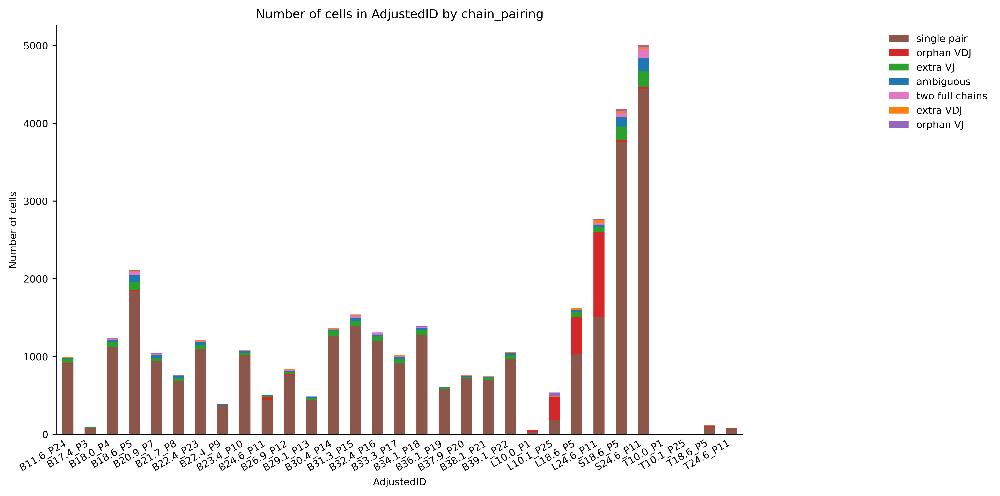

In [21]:
plt.style.use('default')
plt.rcParams['figure.figsize'] = [4, 4]
plt.rcParams['figure.dpi'] = 300

_ = ir.pl.group_abundance(adata_bcr2, groupby="AdjustedID", target_col="chain_pairing", sort="alphabetical",fig_kws={"figsize": (10, 6)})


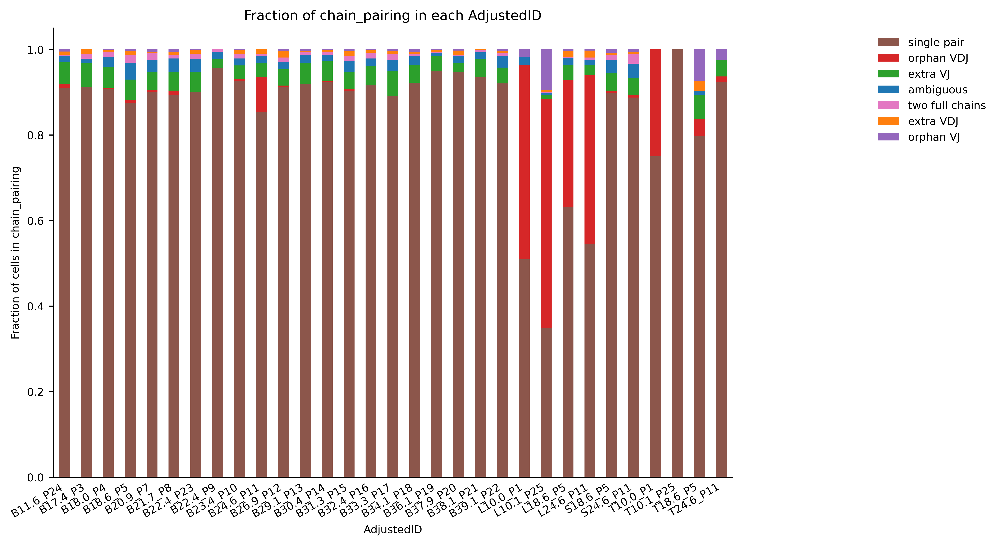

In [22]:
plt.style.use('default')
plt.rcParams['figure.figsize'] = [4, 4]
plt.rcParams['figure.dpi'] = 300

_ = ir.pl.group_abundance(adata_bcr2, groupby="AdjustedID", sort="alphabetical", target_col="chain_pairing", normalize=True,fig_kws={"figsize": (9, 6)})

# .obs['Centre'].value_counts()

In [23]:
adata_bcr2.obs['new_Body']=adata_bcr2.obs['New_Body']

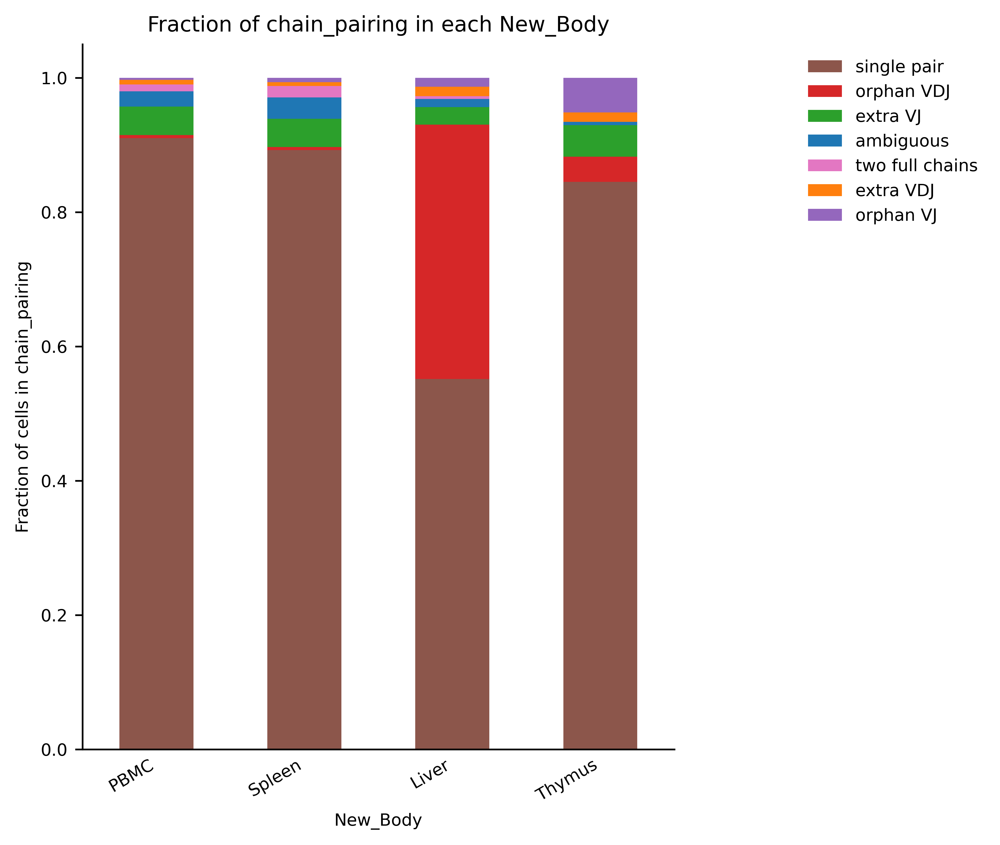

In [24]:
plt.style.use('default')
plt.rcParams['figure.figsize'] = [4, 4]
plt.rcParams['figure.dpi'] = 300

_ = ir.pl.group_abundance(adata_bcr2, groupby="New_Body", target_col="chain_pairing", normalize=True,fig_kws={"figsize": (5, 6)})

# .obs['Centre'].value_counts()

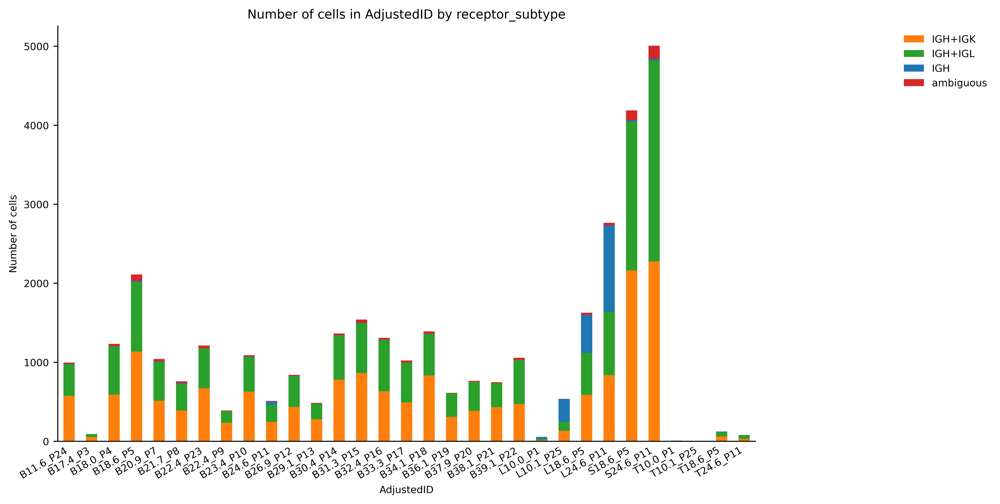

In [25]:
import matplotlib.pyplot as plt

plt.rcParams.update({"font.size": 14})  # 设置字体大小为14
adata_bcr3=adata_bcr2
adata_bcr3.obs.sort_values("AdjustedID", inplace=True)
_ = ir.pl.group_abundance(
    adata_bcr3, groupby="AdjustedID", sort="alphabetical", target_col="receptor_subtype", normalize=False,fig_kws={"figsize": (10, 6)}
)

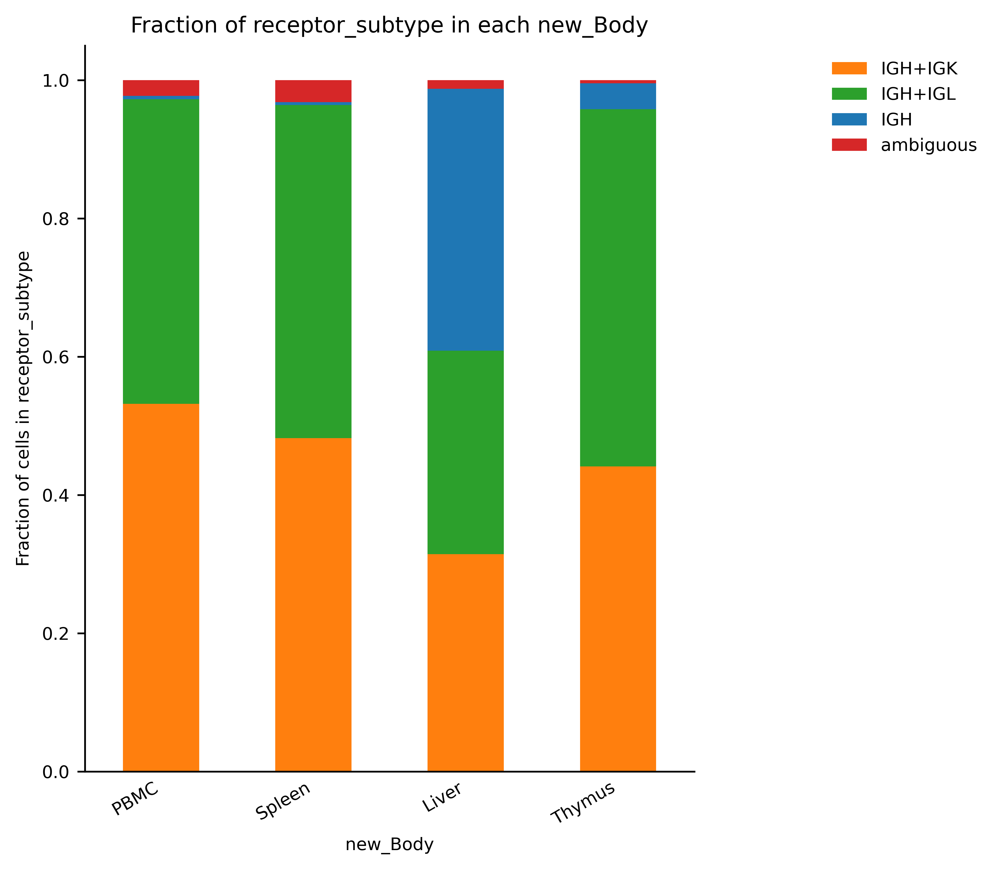

In [26]:

_ = ir.pl.group_abundance(
    adata_bcr2, groupby="new_Body", target_col="receptor_subtype", normalize=True,fig_kws={"figsize": (5, 6)}
)

In [27]:
def create_palette(cell_types, colors):
    cell_type_colors = {}
    for i, cell_type in enumerate(cell_types):
        color = colors[i % len(colors)]
        cell_type_colors[cell_type] = color
    return cell_type_colors
colorname2=["#46A040" ,"#00AF99", "#FFC179" ,"#98D9E9" ,"#F6313E", "#FFA300", "#333366", "#FF5A00", "#663366","#FF6666",
"#8F1336", "#0081C9", "#001588", "#CC0033","#CC9966","#CC0033","#999933","#009966","#CCCC33","#CCFF99","#333399","#993333",
"#490C65", "#BA7FD0","#A6CEE3", "#1F78B4", "#DE77AE", "#B2DF8A", "#006D2C", "#868686", "#B5AD64","#9DA8E2","#91C392","#FF9900","#339966"]

/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


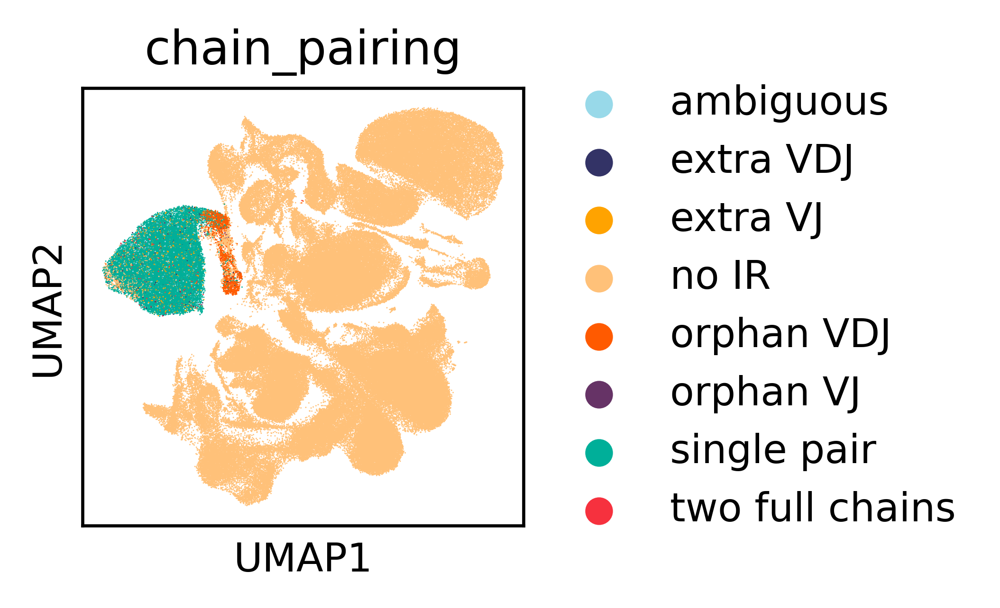

In [28]:
plt.style.use('default')
plt.rcParams['figure.figsize'] = [2, 2]
plt.rcParams['figure.dpi'] = 300
sc.pl.umap(adata1, color=["chain_pairing"],palette=create_palette(adata1.obs["chain_pairing"].unique(),colorname2[1:22]))

In [29]:
adata=adata1[adata1.obs['chain_pairing'].isin(['single pair','extra VJ','extra VDJ'])]

In [30]:
adata=adata[adata.obs['Last_cell_type'].str.contains('B')]

/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


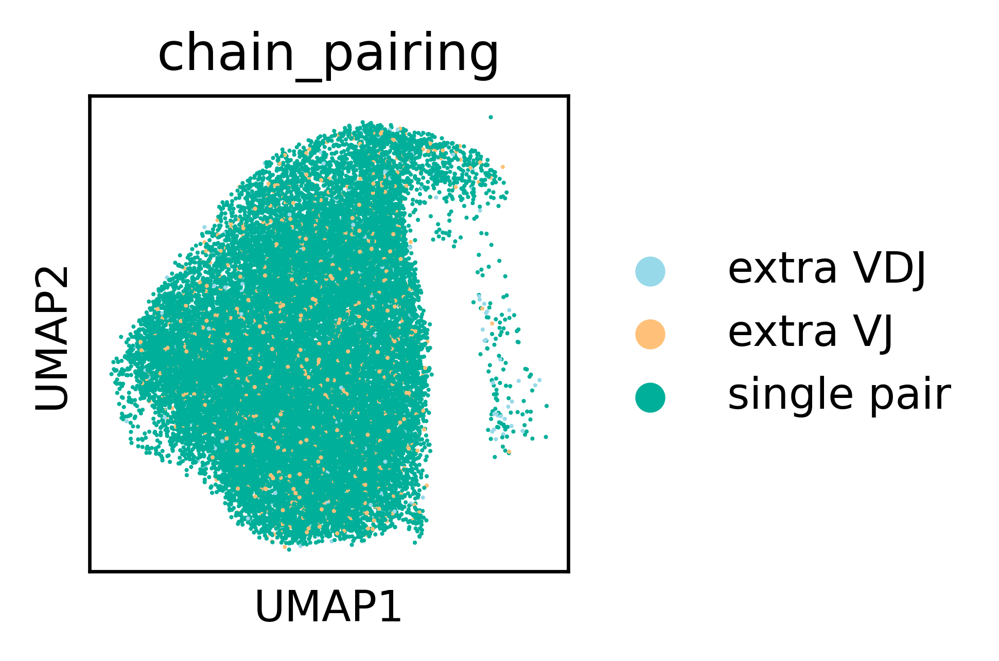

In [31]:
plt.style.use('default')
plt.rcParams['figure.figsize'] = [2, 2]
plt.rcParams['figure.dpi'] = 300
sc.pl.umap(adata, color=["chain_pairing"],palette=create_palette(adata.obs["chain_pairing"].unique(),colorname2[1:22]))

In [32]:

aa_columns = [col for col in adata.obs.columns if 'aa' in col]

print(aa_columns)
adata.obs[aa_columns]

['IR_VJ_1_junction_aa', 'IR_VJ_2_junction_aa', 'IR_VDJ_1_junction_aa', 'IR_VDJ_2_junction_aa']


,IR_VJ_1_junction_aa,IR_VJ_2_junction_aa,IR_VDJ_1_junction_aa,IR_VDJ_2_junction_aa
Cellname,,,,
Z48_AAACCTGAGATAGGAG-1,CAAWDDSLNGPVF,NaN,CARDKTGDALLDYW,NaN
Z48_AAATGCCCATATACGC-1,CQQYNNWPPITF,NaN,CAKGYSSSWYDYW,NaN
Z48_AACTGGTGTCCATGAT-1,CAAWDDSLNGQVF,NaN,CARGAFDIW,NaN
Z48_ACAGCTACACATGGGA-1,CQQYGSSPWTF,NaN,CARVGGDDAFDIW,NaN
Z48_ACATACGCACTCTGTC-1,CQQLNSYPLGGLKNTF,NaN,CARGRSSSWYDYW,NaN
...,...,...,...,...
Z123_TTTGCGCTCTTAGAGC-1,CQQSYSTPYTF,NaN,CARDSPGITGTTYYMDVW,NaN
Z123_TTTGTCAAGTACACCT-1,CMQALQTPWTF,NaN,CARDYRGWYFDYW,NaN
Z123_TTTGTCAGTTTGTTGG-1,CLSADSSGTYRVF,NaN,CAALQGSSTSCYFDYW,NaN


In [90]:
adata2=adata1[adata1.obs['Last_cell_type'].str.contains(' B|-B')]

/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


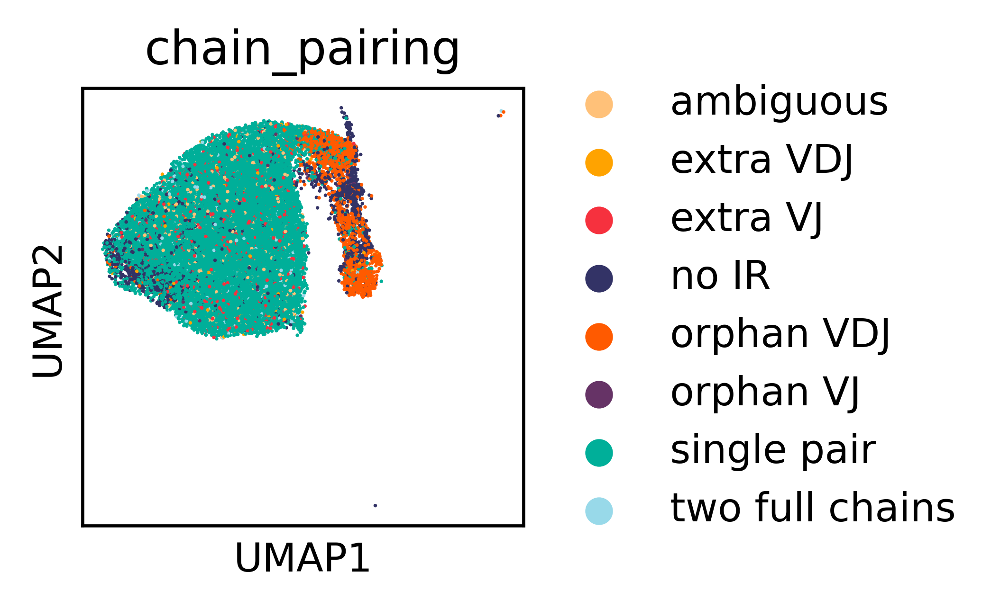

In [91]:
plt.style.use('default')
plt.rcParams['figure.figsize'] = [2, 2]
plt.rcParams['figure.dpi'] = 300
sc.pl.umap(adata2, color=["chain_pairing"],palette=create_palette(adata2.obs["chain_pairing"].unique(),colorname2[1:22]))

In [35]:
import warnings

warnings.filterwarnings(
    "ignore",
    ".*IProgress not found*",
)
warnings.simplefilter(action="ignore", category=FutureWarning)

from palmotif import compute_motif, svg_logo
import scanpy as sc
import dandelion as ddl
import scirpy as ir
import pandas as pd
import numpy as np
import seaborn as sb

import os

import matplotlib as mpl
import matplotlib.pyplot as plt

warnings.simplefilter(action="ignore", category=pd.errors.DtypeWarning)

In [36]:
testvdh = ddl.from_scirpy(adata)
testvdh

Dandelion class object with n_obs = 31502 and n_contigs = 64661
    data: 'sequence_id', 'sequence', 'rev_comp', 'productive', 'v_call', 'd_call', 'j_call', 'sequence_alignment', 'germline_alignment', 'junction', 'junction_aa', 'v_cigar', 'd_cigar', 'j_cigar', 'c_call', 'consensus_count', 'duplicate_count', 'locus', 'cell_id', 'multi_chain', 'receptor_subtype', 'high_confidence', 'predicted_doublets', 'AdjustedID', 'Last_cell_type_num2', 'n_genes_by_counts', 'conf_score', 'Name', 'Cellname', 'doublet_scores', 'Last_cell_type_num', 'total_counts', 'n_genes', 'chain_pairing', 'receptor_type', 'is_cell', 'Week', 'TCRBCRlabel', 'predicted_labels', 'over_clustering', 'Last_cell_type', 'Cell_lineage', 'leiden', 'total_counts_mt', 'pct_counts_mt', 'Last_cell_type2', 'New_Body', 'majority_voting', 'rearrangement_status'
    metadata: 'locus_VDJ', 'locus_VJ', 'productive_VDJ', 'productive_VJ', 'v_call_VDJ', 'd_call_VDJ', 'j_call_VDJ', 'v_call_VJ', 'j_call_VJ', 'c_call_VDJ', 'c_call_VJ', 'juncti

In [37]:
vdjx = ddl.from_scirpy(adata)
vdjx

Dandelion class object with n_obs = 31502 and n_contigs = 64661
    data: 'sequence_id', 'sequence', 'rev_comp', 'productive', 'v_call', 'd_call', 'j_call', 'sequence_alignment', 'germline_alignment', 'junction', 'junction_aa', 'v_cigar', 'd_cigar', 'j_cigar', 'c_call', 'consensus_count', 'duplicate_count', 'locus', 'cell_id', 'multi_chain', 'receptor_subtype', 'high_confidence', 'predicted_doublets', 'AdjustedID', 'Last_cell_type_num2', 'n_genes_by_counts', 'conf_score', 'Name', 'Cellname', 'doublet_scores', 'Last_cell_type_num', 'total_counts', 'n_genes', 'chain_pairing', 'receptor_type', 'is_cell', 'Week', 'TCRBCRlabel', 'predicted_labels', 'over_clustering', 'Last_cell_type', 'Cell_lineage', 'leiden', 'total_counts_mt', 'pct_counts_mt', 'Last_cell_type2', 'New_Body', 'majority_voting', 'rearrangement_status'
    metadata: 'locus_VDJ', 'locus_VJ', 'productive_VDJ', 'productive_VJ', 'v_call_VDJ', 'd_call_VDJ', 'j_call_VDJ', 'v_call_VJ', 'j_call_VJ', 'c_call_VDJ', 'c_call_VJ', 'juncti

In [38]:
vdjx.data["v_call"].replace("", np.nan, inplace=True)
vdjx.data.dropna(subset=["v_call"], inplace=True)

vdjx.data["j_call"].replace("", np.nan, inplace=True)
vdjx.data.dropna(subset=["j_call"], inplace=True)

vdjx.data["junction_aa"].replace("", np.nan, inplace=True)
vdjx.data.dropna(subset=["junction_aa"], inplace=True)

vdjx.data["junction_length"] = [len(a) for a in vdjx.data["junction_aa"]]

In [39]:
# ddl.pp.calculate_threshold(vdjx, model="hh_s5f", plot=False)
# Calculating threshold
# Rerun this after filtering. For now, switching to heavy mode.
#       Threshold method 'density' did not return with any values. Switching to method = 'gmm'.
# Automatic Threshold : 0.16
#  method = gmm
#  finished (1:23:12)
# 0.15858785672187678

vdjx.threshold=0.15858785672187678

In [40]:
ddl.tl.define_clones(vdjx, key_added="changeo_clone_id", model="hh_s5f")

Finding clones
Running command: DefineClones.py -d /tmp/tmp9784xn4a/tmp/dandelion_define_clones_heavy-clone.tsv -o /tmp/tmp9lc7o2dw/dandelion_define_clones_heavy-clone.tsv --act set --model hh_s5f --norm len --dist 0.15858785672187678 --nproc 1 --vf v_call



/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/Bio/pairwise2.py:278: BiopythonDeprecationWarning: Bio.pairwise2 has been deprecated, and we intend to remove it in a future release of Biopython. As an alternative, please consider using Bio.Align.PairwiseAligner as a replacement, and contact the Biopython developers if you still need the Bio.pairwise2 module.
  warnings.warn(


       START> DefineClones
        FILE> dandelion_define_clones_heavy-clone.tsv
   SEQ_FIELD> junction
     V_FIELD> v_call
     J_FIELD> j_call
 MAX_MISSING> 0
GROUP_FIELDS> None
      ACTION> set
        MODE> gene
    DISTANCE> 0.15858785672187678
     LINKAGE> single
       MODEL> hh_s5f
        NORM> len
         SYM> avg
       NPROC> 1

PROGRESS> [Grouping sequences] 10:13:37 (31763) 0.1 min

PROGRESS> [Assigning clones] 10:16:17 |####################| 100% (31,763) 2.8 min

 OUTPUT> dandelion_define_clones_heavy-clone.tsv
 CLONES> 26887
RECORDS> 31763
   PASS> 31763
   FAIL> 0
    END> DefineClones

 finished (0:09:55)


In [41]:
ddl.tl.generate_network(
    vdjx, key="sequence_alignment", layout_method="sfdp", clone_key="changeo_clone_id"
)

Generating network


Setting up data: 64661it [00:09, 6546.65it/s]
Generating edge list :   0%|          | 0/326 [00:00<?, ?it/s]                                                                                                                                                  /data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/dandelion/tools/_network.py:263: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/dandelion/tools/_network.py:263: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/dandelion/tools/_network.py:263: SettingW

Generating edge list :  28%|██▊       | 91/326 [00:00<00:00, 908.20it/s]                                                                                                                                        /data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/dandelion/tools/_network.py:263: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/dandelion/tools/_network.py:263: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/dandelion/tools/_network.py:263: SettingWithCopyWarning: 
A value is trying to be set o

Generating edge list :  56%|█████▌    | 182/326 [00:00<00:00, 894.09it/s]                                                                                                                                       /data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/dandelion/tools/_network.py:263: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/dandelion/tools/_network.py:263: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/dandelion/tools/_network.py:263: SettingWithCopyWarning: 
A value is trying to be set o

Generating edge list :  83%|████████▎ | 272/326 [00:00<00:00, 883.19it/s]                                                                                                                                       /data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/dandelion/tools/_network.py:263: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/dandelion/tools/_network.py:263: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/dandelion/tools/_network.py:263: SettingWithCopyWarning: 
A value is trying to be set o

Linking edges : 100%|██████████| 30887/30887 [00:00<00:00, 32789.34it/s]                                                                                                                                        


generating network layout
 finished (0:28:08)


Transferring network
converting matrices
Updating anndata slots
 finished (0:00:25)


/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


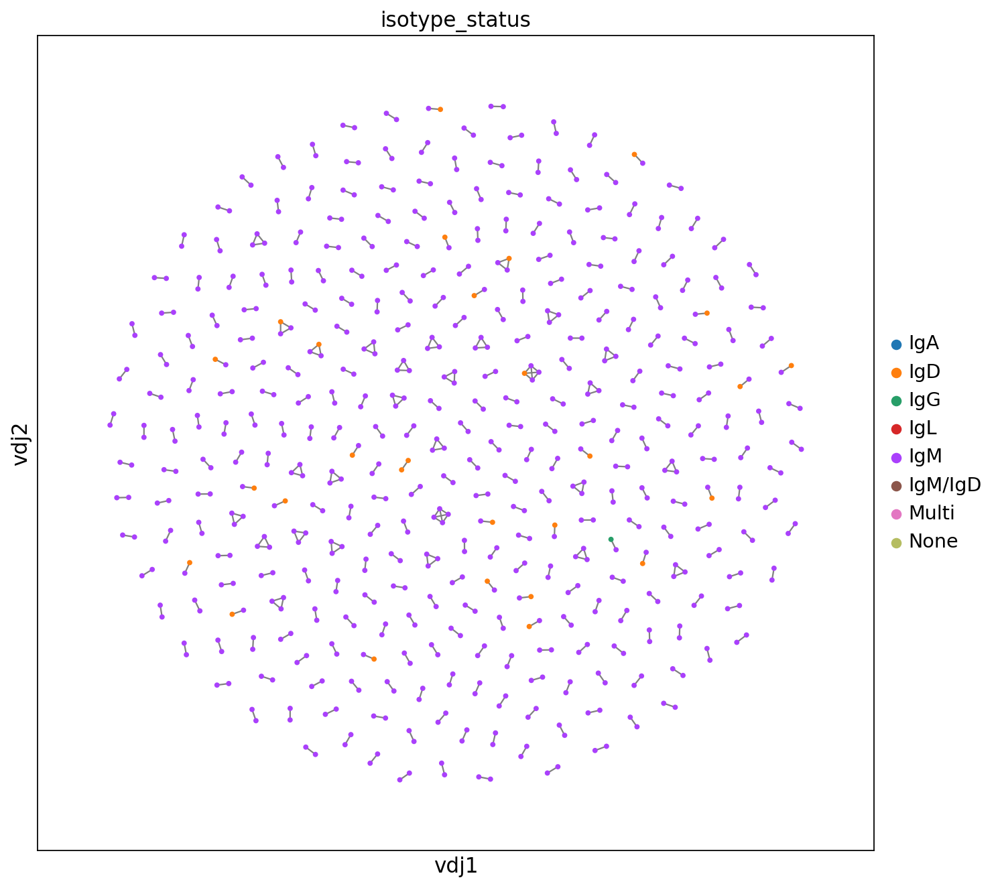

In [42]:
ddl.tl.transfer(adata, vdjx, clone_key="changeo_clone_id", expanded_only=True)

edgeweights = [
    1 / (e + 1) for e in ddl.tl.extract_edge_weights(vdjx)
]  # invert and add 1 to each edge weight (e) so that distance of 0 becomes the thickest edge
# therefore, the thicker the line, the shorter the edit distance.

sc.set_figure_params(figsize=[10, 10])
_ = ddl.pl.clone_network(
    adata,
    color=["isotype_status"],
    legend_fontoutline=3,
    edges_width=edgeweights,
    size=50,
)

/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


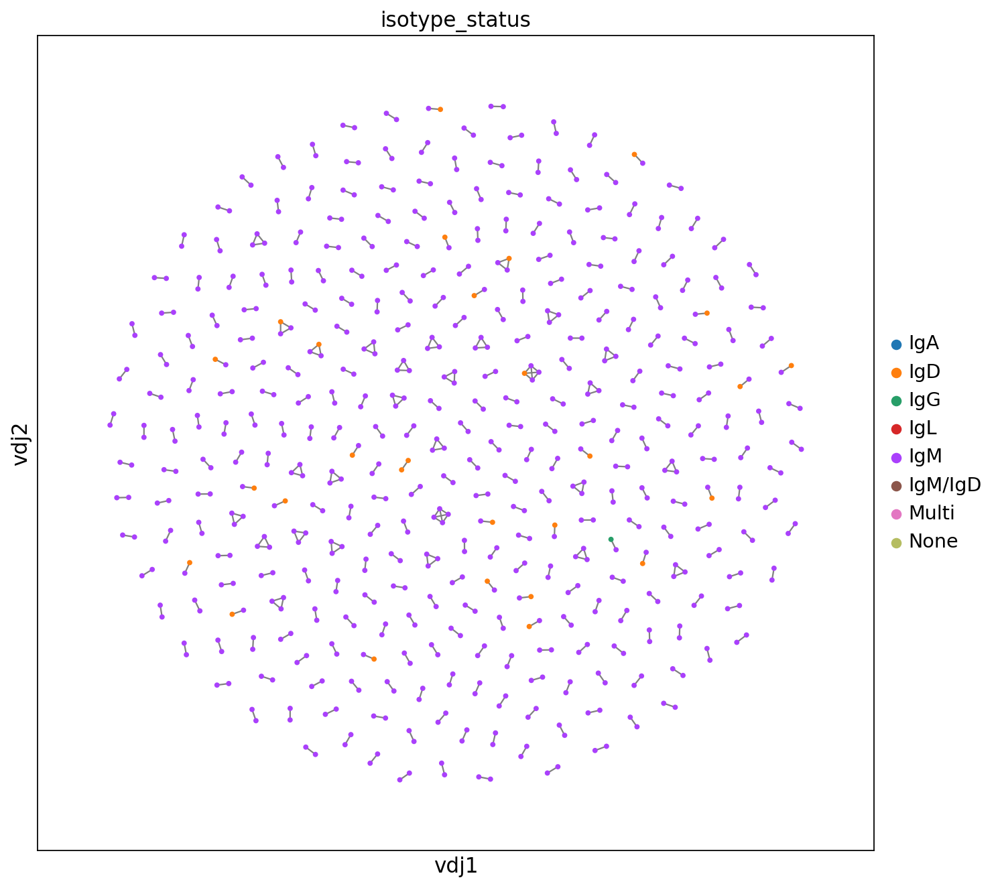

In [43]:
_ = ddl.pl.clone_network(
    adata,
    color=["isotype_status"],
    legend_fontoutline=3,
    edges_width=edgeweights,
    size=50,
)

/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


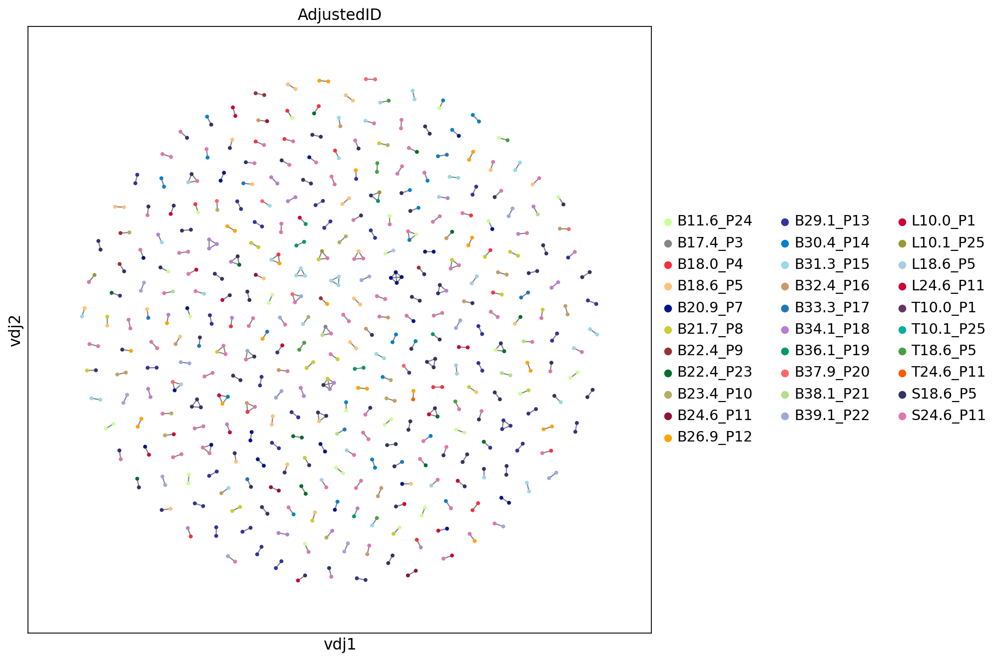

In [44]:
sc.set_figure_params(figsize=[10, 10])
_ = ddl.pl.clone_network(
    adata,
    color=["AdjustedID"],
    legend_fontoutline=3,
    edges_width=edgeweights,
    size=50,
)

/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


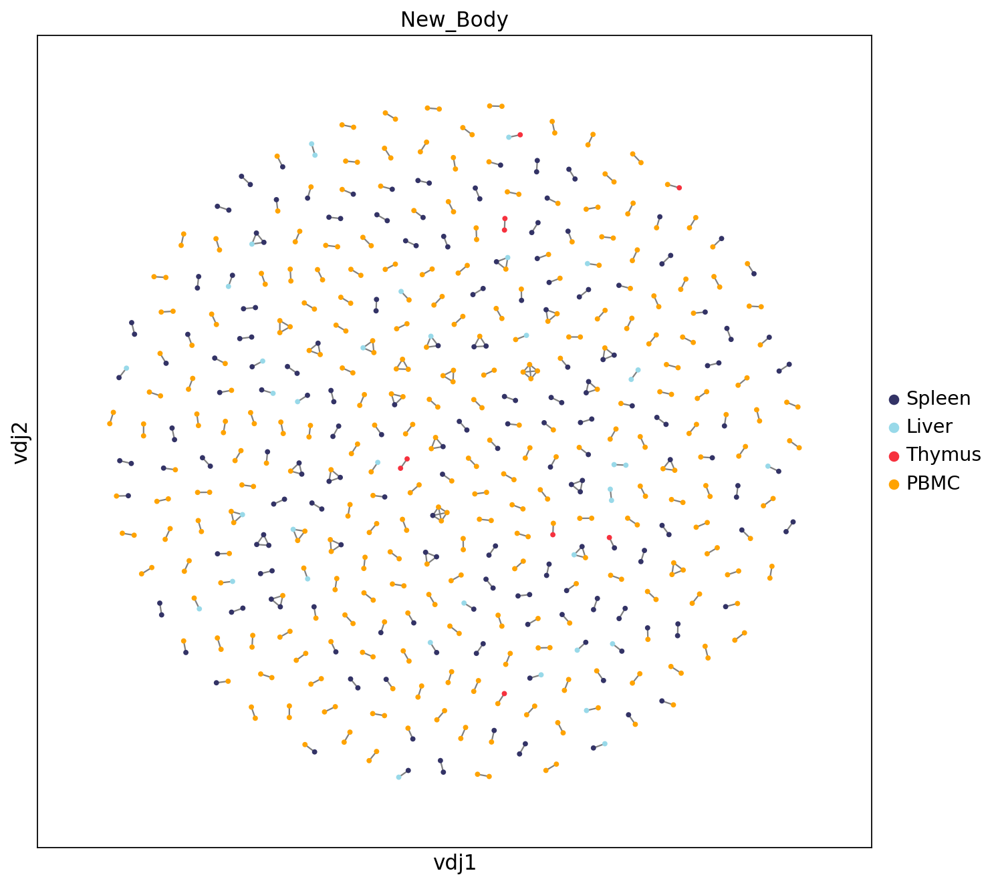

In [45]:
sc.set_figure_params(figsize=[10, 10])
_ = ddl.pl.clone_network(
    adata,
    color=["New_Body"],
    legend_fontoutline=3,
    edges_width=edgeweights,
    size=50,
)

In [46]:
from scanpy.plotting._tools.scatterplots import embedding

/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored


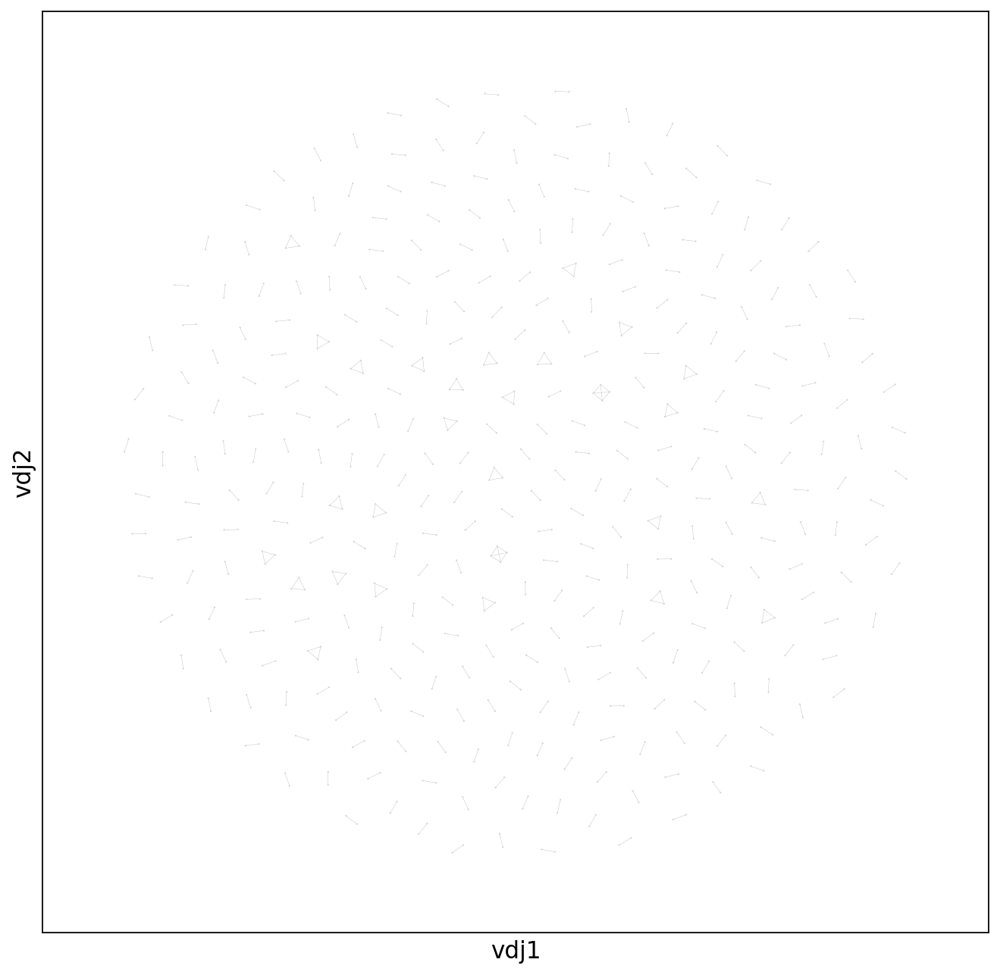

In [47]:
embedding(adata, basis='vdj', edges=True)

In [48]:
import numpy
import os

print(os.path.dirname(ddl.__file__))

/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/dandelion


In [49]:
adata.obsm['X_vdj'].shape

(31502, 2)

In [50]:
import pandas as pd

vdj_data = adata.obsm['X_vdj']


vdj_df = pd.DataFrame(vdj_data)


vdj_df = vdj_df.dropna()
vdj_df.index

Int64Index([   15,   156,   204,   242,   586,   640,   691,   707,   802,
              878,
            ...
            30748, 30760, 30781, 30881, 30904, 30980, 31172, 31319, 31343,
            31380],
           dtype='int64', length=680)

In [51]:

adatasub = adata.obs.iloc[vdj_df.index, :]
adatasub2=adata[adatasub.index]

In [52]:
adatasub2

View of AnnData object with n_obs × n_vars = 680 × 31424
    obs: 'Name', 'doublet_scores', 'predicted_doublets', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'Cellname', 'AdjustedID', 'New_Body', 'Week', 'TCRBCRlabel', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'Last_cell_type', 'Cell_lineage', 'Last_cell_type2', 'Last_cell_type_num', 'Last_cell_type_num2', 'is_cell', 'high_confidence', 'multi_chain', 'extra_chains', 'IR_VJ_1_c_call', 'IR_VJ_2_c_call', 'IR_VDJ_1_c_call', 'IR_VDJ_2_c_call', 'IR_VJ_1_consensus_count', 'IR_VJ_2_consensus_count', 'IR_VDJ_1_consensus_count', 'IR_VDJ_2_consensus_count', 'IR_VJ_1_d_call', 'IR_VJ_2_d_call', 'IR_VDJ_1_d_call', 'IR_VDJ_2_d_call', 'IR_VJ_1_duplicate_count', 'IR_VJ_2_duplicate_count', 'IR_VDJ_1_duplicate_count', 'IR_VDJ_2_duplicate_count', 'IR_VJ_1_j_call', 'IR_VJ_2_j_call', 'IR_VDJ_1_j_call', 'IR_VDJ_2_j_call', 'IR_VJ_1_junction', 'IR_VJ_2_junction', 'IR_VDJ_1_junction

In [53]:
# connections_counts.sum()

In [54]:
# index_to_label

In [55]:
# edges_labels

In [56]:

# edges_labels_joined = []


# for edge_labels in edges_labels:
#     edges_labels_joined.append('-'.join(edge_labels))

# edges_labels_joined =  pd.Series(edges_labels_joined)

# print(edges_labels_joined.value_counts())

/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


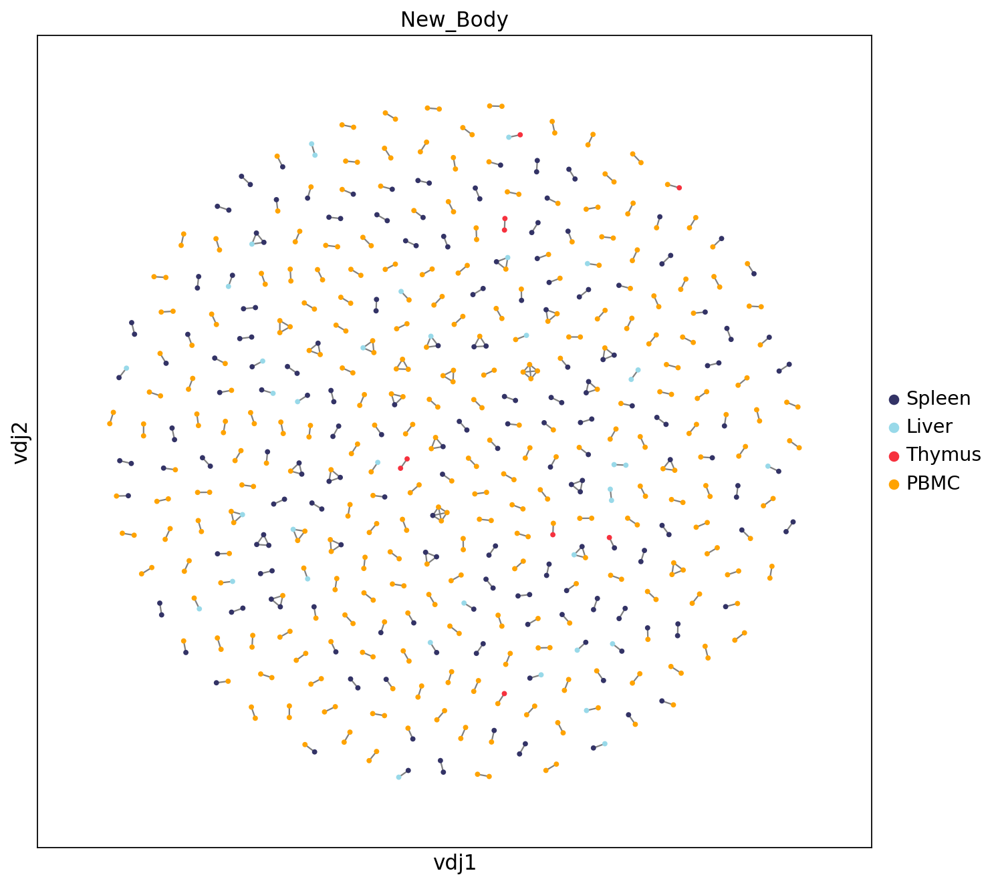

In [57]:
# edgeweights
sc.pl.embedding(adatasub2, basis='vdj', edges=True,color=["New_Body"],legend_fontoutline=3, edges_width=edgeweights,size=50)

/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


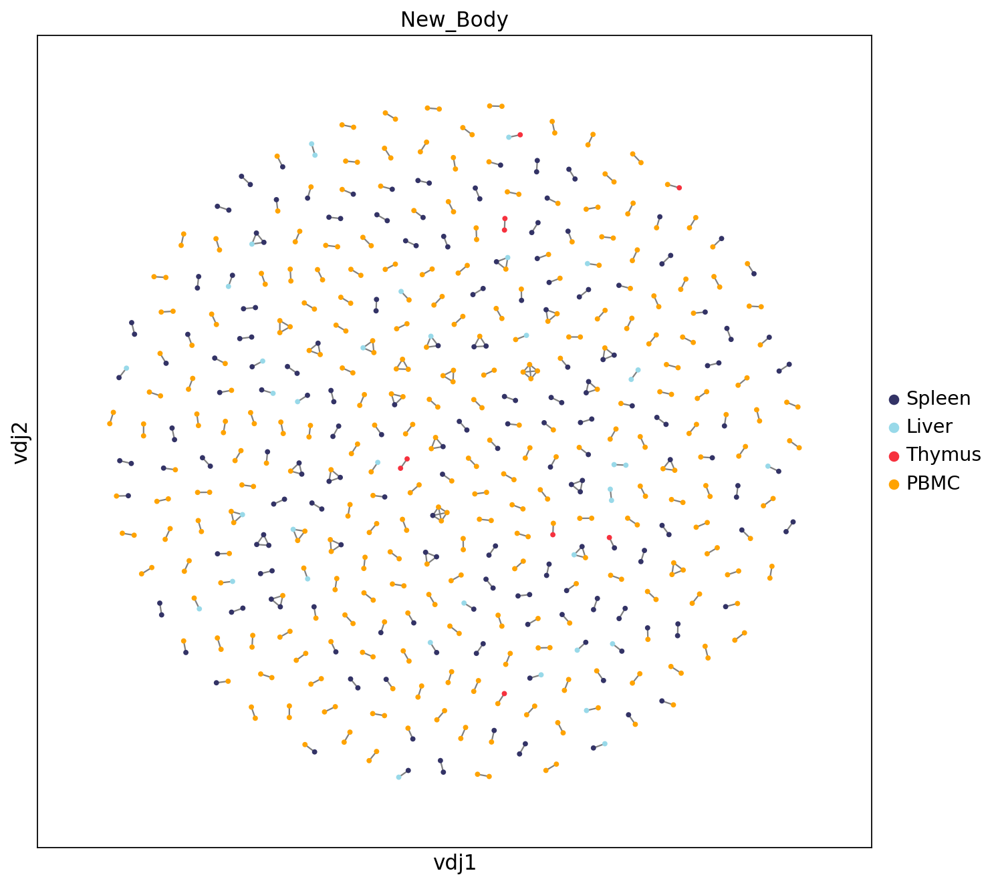

In [58]:
# edgeweights
sc.pl.embedding(adata, basis='vdj', edges=True,color=["New_Body"],legend_fontoutline=3, edges_width=edgeweights,size=50)

/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


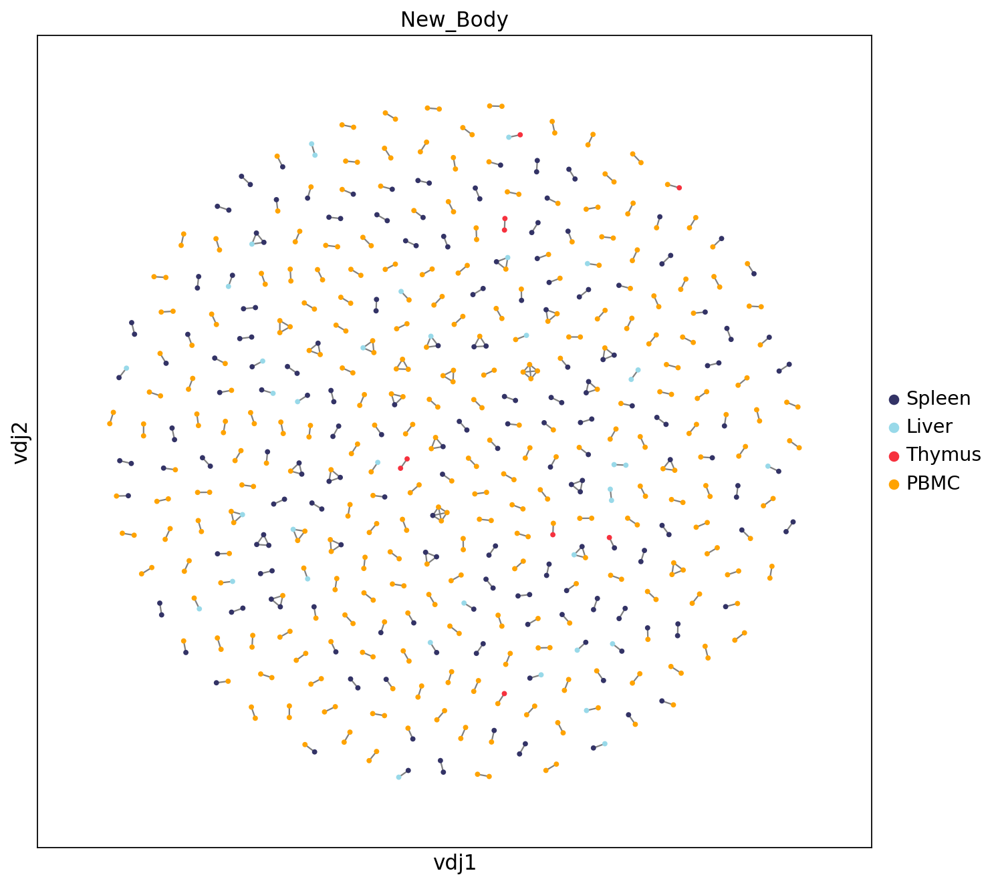

In [59]:
sc.set_figure_params(figsize=[10, 10])
_ = ddl.pl.clone_network(
    adata,
    color=["New_Body"],
    legend_fontoutline=3,
    edges_width=edgeweights,
    size=50,
)

In [60]:
ddl.tl.clone_size(vdjx, clone_key="changeo_clone_id")
ddl.tl.transfer(adata, vdjx, clone_key="changeo_clone_id")

Quantifying clone sizes
 finished (0:00:00)
Transferring network
converting matrices
Updating anndata slots
 finished (0:01:28)


In [61]:
ddl.tl.clone_size(vdjx, clone_key="changeo_clone_id", max_size=6)
ddl.tl.transfer(adata, vdjx, clone_key="changeo_clone_id")

Quantifying clone sizes
 finished (0:00:00)
Transferring network
converting matrices
Updating anndata slots
 finished (0:01:30)


In [62]:
# help(ddl.pl.clone_network)

/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


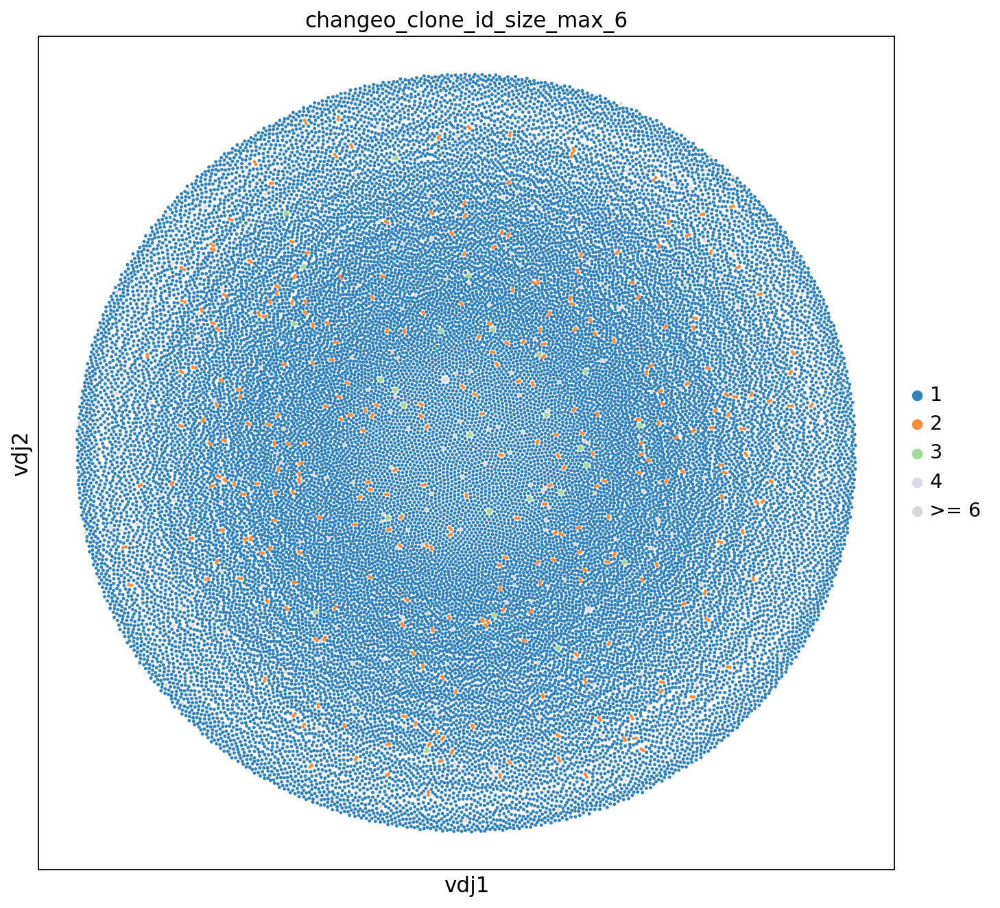

In [63]:
_ = ddl.pl.clone_network(
    adata,
    color=["changeo_clone_id_size_max_6"],
    ncols=2,
    legend_fontoutline=3,
    edges_width=1,
    palette="tab20c",
    size=20,
)

(<Figure size 640x240 with 1 Axes>,
 <Axes: title={'center': 'isotype status usage'}, ylabel='proportion'>)

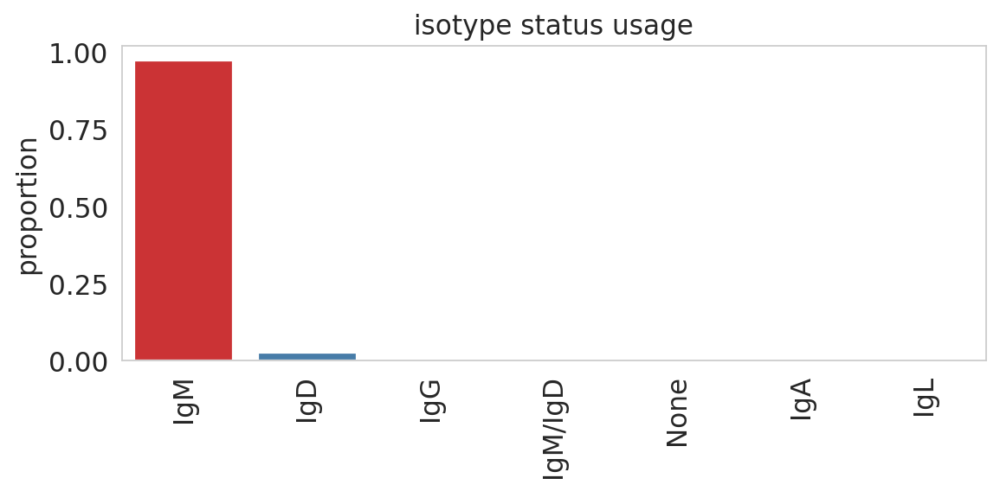

In [64]:
import matplotlib as mpl
# mpl.rcParams.update(mpl.rcParamsDefault)
ddl.pl.barplot(vdjx[vdjx.metadata.isotype_status != 'Multi'], # remove multi from the plots
               color = 'isotype_status',clone_key="changeo_clone_id")

In [65]:
# help(ddl.pl.barplot)

In [66]:
# adata

In [67]:
vdjx.metadata

,changeo_clone_id,changeo_clone_id_by_size,locus_VDJ,locus_VJ,productive_VDJ,productive_VJ,v_call_VDJ,d_call_VDJ,j_call_VDJ,v_call_VJ,...,v_call_B_VJ_main,j_call_B_VJ_main,isotype,isotype_status,locus_status,chain_status,rearrangement_status_VDJ,rearrangement_status_VJ,changeo_clone_id_size,changeo_clone_id_size_max_6
B25_AAACCTGAGGCAGGTT-1,719_0,1153,IGH,IGK,True,True,IGHV3-7,None,IGHJ3,IGKV1-9,...,IGKV1-9,IGKJ4,IgM,IgM,IGH + IGK,Single pair,standard,standard,1.0,1
B25_AAACCTGAGGGAACGG-1,4394_1,25798,IGH,IGL,True,True,IGHV1-8,None,IGHJ4,IGLV2-23,...,IGLV2-23,IGLJ3,IgM,IgM,IGH + IGL,Single pair,standard,standard,1.0,1
B25_AAACCTGCATGAACCT-1,5473_2,20670,IGH,IGL,True,True,IGHV1-69D,IGHD7-27,IGHJ3,IGLV2-11,...,IGLV2-11,IGLJ3,IgM,IgM,IGH + IGL,Single pair,standard,standard,1.0,1
B25_AAACCTGCATGTAGTC-1,6085_3,20669,IGH,IGL,True,True,IGHV4-59,None,IGHJ5,IGLV1-44,...,IGLV1-44,IGLJ3,IgM,IgM,IGH + IGL,Single pair,standard,standard,1.0,1
B25_AAACCTGGTATGAATG-1,5868_4,20668,IGH,IGL,True,True,IGHV4-59,None,IGHJ3,IGLV3-1,...,IGLV3-1,IGLJ2,IgM,IgM,IGH + IGL,Single pair,standard,standard,1.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
z104_TTTCCTCTCTGATTCT-1,9929_30881,10423,IGH,IGK,True,True,IGHV3-33,None,IGHJ3,IGKV1D-17,...,IGKV1D-17,IGKJ2,IgM,IgM,IGH + IGK,Single pair,standard,standard,1.0,1
z104_TTTGCGCTCATCGCTC-1,11339_30882,10422,IGH,IGK,True,True,IGHV3-9,None,IGHJ2,IGKV1-27,...,IGKV1-27,IGKJ4,IgM,IgM,IGH + IGK,Single pair,standard,standard,1.0,1
z104_TTTGGTTGTGTGTGCC-1,24101_30883,10421,IGH,IGK,True,True,IGHV4-30-4,None,IGHJ4,IGKV2-24,...,IGKV2-24,IGKJ3,IgM,IgM,IGH + IGK,Single pair,standard,standard,1.0,1
z104_TTTGGTTTCTGGCGTG-1,24105_30884,10420,IGH,IGK,True,True,IGHV3-7,None,IGHJ4,IGKV2D-28,...,IGKV2D-28,IGKJ4,IgM,IgM,IGH + IGK,Single pair,standard,standard,1.0,1


In [68]:
vdjx.data

,sequence_id,sequence,rev_comp,productive,v_call,d_call,j_call,sequence_alignment,germline_alignment,junction,...,Cell_lineage,leiden,total_counts_mt,pct_counts_mt,Last_cell_type2,New_Body,majority_voting,rearrangement_status,junction_length,changeo_clone_id
sequence_id,,,,,,,,,,,,,,,,,,,,,
B25_AAACCTGAGGCAGGTT-1_contig_1,B25_AAACCTGAGGCAGGTT-1_contig_1,None,None,True,IGKV1-9,None,IGKJ4,None,None,TGTCAACAGCTTAATAGTTACCCGCTCACTTTC,...,B_CELL,3,30.826515,0.992256,CXCR5+ Naïve B,Spleen,Naive B cells,standard,11,719_0
B25_AAACCTGAGGCAGGTT-1_contig_2,B25_AAACCTGAGGCAGGTT-1_contig_2,None,None,True,IGHV3-7,None,IGHJ3,None,None,TGTGCGAGAGCCGTTCCCAACTGGAACTACGATGCTTTTGATATCTGG,...,B_CELL,3,30.826515,0.992256,CXCR5+ Naïve B,Spleen,Naive B cells,standard,16,719_0
B25_AAACCTGAGGGAACGG-1_contig_1,B25_AAACCTGAGGGAACGG-1_contig_1,None,None,True,IGLV2-23,None,IGLJ3,None,None,TGCTGCTCATATGCAGGTAGTTGGGTGTTC,...,B_CELL,3,37.767254,1.891497,CXCR5+ Naïve B,Spleen,Naive B cells,standard,10,4394_1
B25_AAACCTGAGGGAACGG-1_contig_2,B25_AAACCTGAGGGAACGG-1_contig_2,None,None,True,IGHV1-8,None,IGHJ4,None,None,TGTGCGAGAGCCCTAACGACTCTGGGATACTTTGACTACTGG,...,B_CELL,3,37.767254,1.891497,CXCR5+ Naïve B,Spleen,Naive B cells,standard,14,4394_1
B25_AAACCTGCATGAACCT-1_contig_1,B25_AAACCTGCATGAACCT-1_contig_1,None,None,True,IGLV2-11,None,IGLJ3,None,None,TGCTGCTCATATGCAGGCAGCTACACTTGGGTGTTC,...,B_CELL,3,38.943237,1.462428,CXCR5+ Naïve B,Spleen,Naive B cells,standard,12,5473_2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
z104_TTTGGTTGTGTGTGCC-1_contig_1,z104_TTTGGTTGTGTGTGCC-1_contig_1,None,None,True,IGKV2-24,None,IGKJ3,None,None,TGCACGCAAGCTACACAATTTCCTCATACTTTC,...,B_CELL,3,31.427313,1.234142,CXCR5+ Naïve B,PBMC,Naive B cells,standard,11,24101_30883
z104_TTTGGTTTCTGGCGTG-1_contig_1,z104_TTTGGTTTCTGGCGTG-1_contig_1,None,None,True,IGKV2D-28,None,IGKJ4,None,None,TGCATGCAAGCTCTACAAACTCCGCTCACTTTC,...,B_CELL,3,33.757790,1.253853,CXCR5+ Naïve B,PBMC,Naive B cells,standard,11,24105_30884
z104_TTTGGTTTCTGGCGTG-1_contig_2,z104_TTTGGTTTCTGGCGTG-1_contig_2,None,None,True,IGHV3-7,None,IGHJ4,None,None,TGTGCGAGAGATCGGCGCAACTATTACTGG,...,B_CELL,3,33.757790,1.253853,CXCR5+ Naïve B,PBMC,Naive B cells,standard,10,24105_30884


(<Figure size 960x720 with 1 Axes>,
 <Axes: title={'center': 'v call B VDJ main usage'}, ylabel='proportion'>)

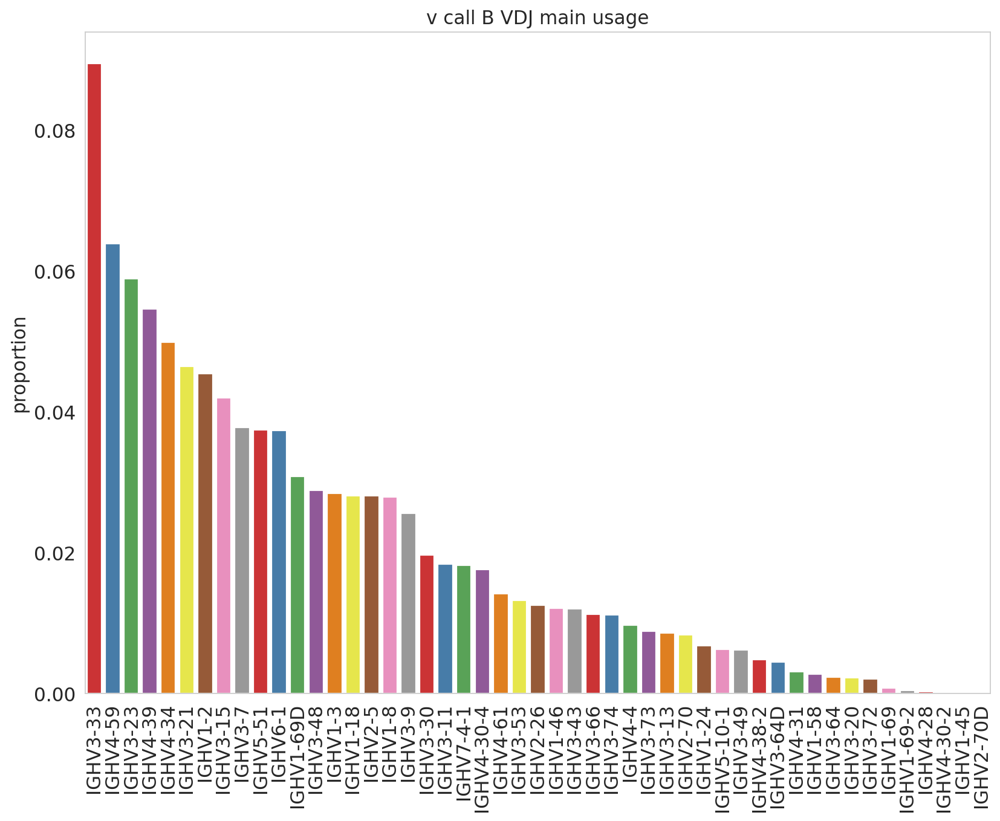

In [69]:
import matplotlib as mpl
# mpl.rcParams.update(mpl.rcParamsDefault)
ddl.pl.barplot(vdjx[vdjx.metadata.isotype_status != 'Multi'], # remove multi from the plots
               color = 'v_call_B_VDJ_main',clone_key="changeo_clone_id",figsize=[12,9])

(<Figure size 960x720 with 1 Axes>,
 <Axes: title={'center': 'v call B VDJ main usage'}, ylabel='proportion'>)

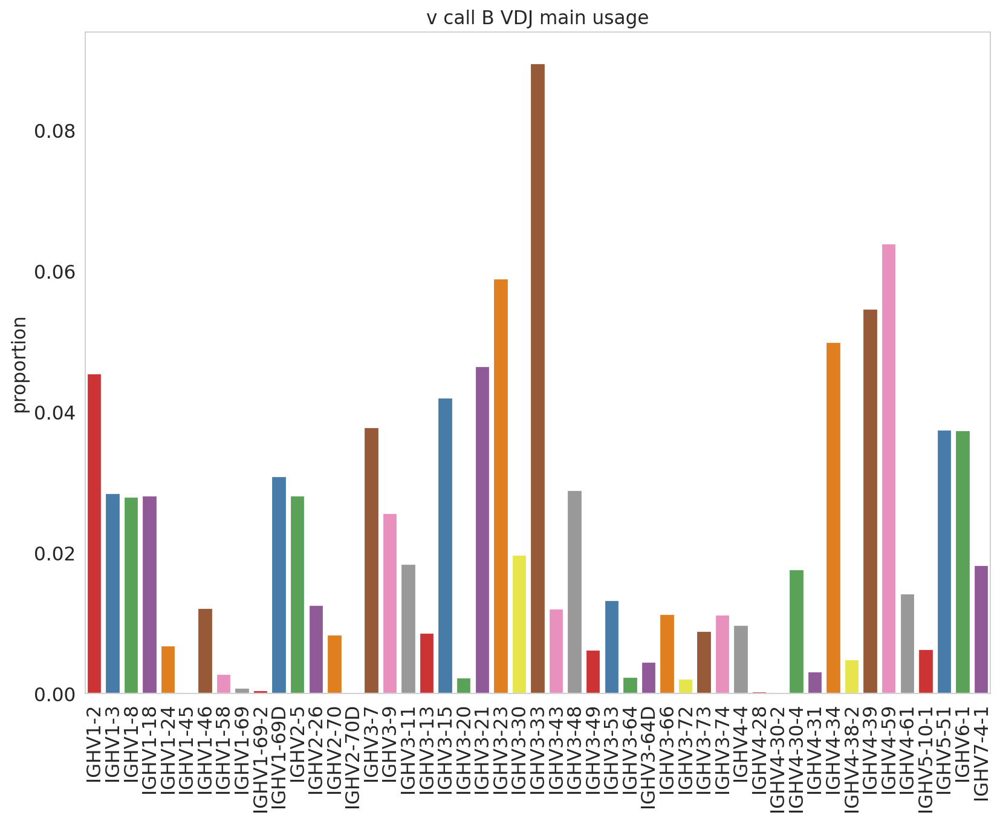

In [70]:
import matplotlib as mpl
# mpl.rcParams.update(mpl.rcParamsDefault)
ddl.pl.barplot(adata[adata.obs.isotype_status != 'Multi'],# remove multi from the plots
               color = 'v_call_B_VDJ_main',clone_key="changeo_clone_id",figsize=[12,9])

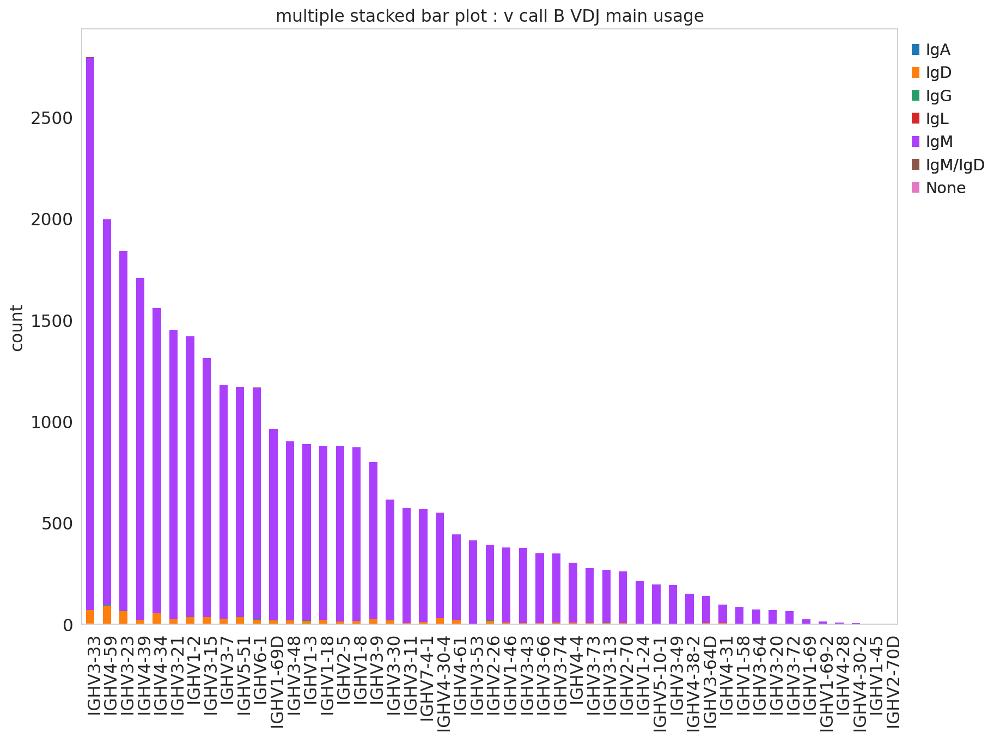

In [71]:
ddl.pl.stackedbarplot(vdjx[vdjx.metadata.isotype_status != 'Multi'], 
                      color = 'v_call_B_VDJ_main', 
                      groupby = 'isotype_status',clone_key="changeo_clone_id",figsize=[12,9]
                     )
plt.legend(bbox_to_anchor = (1,1), 
           loc='upper left', 
           frameon=False)

In [72]:
adata.obs[['isotype_status','isotype']]

,isotype_status,isotype
Cellname,,
Z48_AAACCTGAGATAGGAG-1,IgM,IgM
Z48_AAATGCCCATATACGC-1,IgM,IgM
Z48_AACTGGTGTCCATGAT-1,IgM,IgM
Z48_ACAGCTACACATGGGA-1,IgM,IgM
Z48_ACATACGCACTCTGTC-1,IgM,IgM
...,...,...
Z123_TTTGCGCTCTTAGAGC-1,IgM,IgM
Z123_TTTGTCAAGTACACCT-1,IgM,IgM
Z123_TTTGTCAGTTTGTTGG-1,IgM,IgM


In [73]:
Metadata=adata.obs
Metadata.to_csv('./All_scanpyData/BCRTCR/BCRobsmeta.csv')

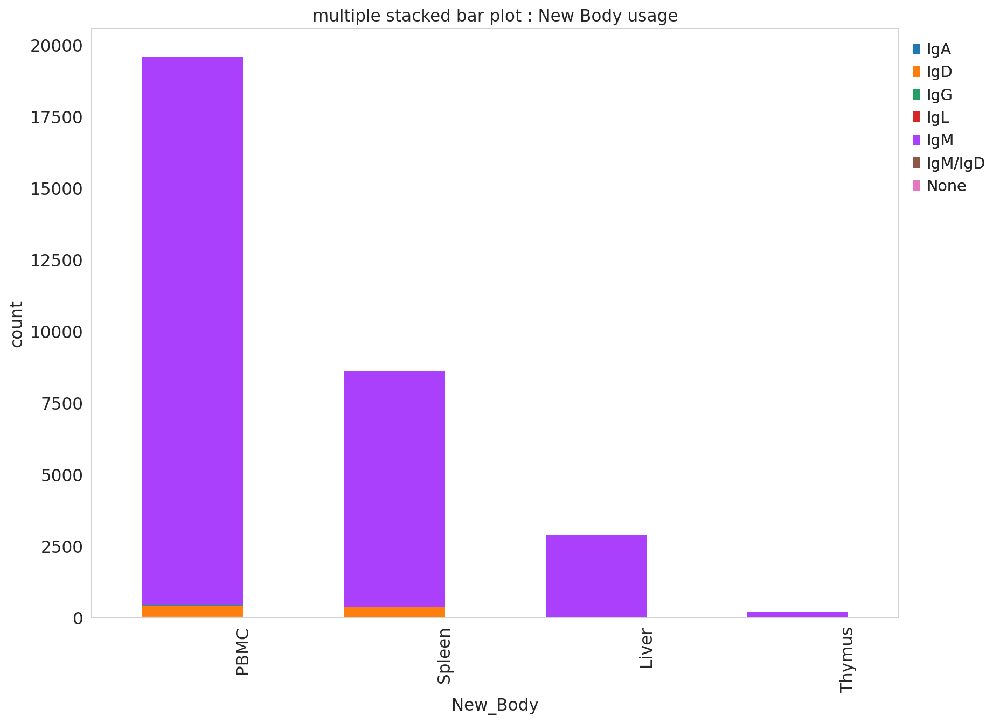

In [74]:
ddl.pl.stackedbarplot(adata[adata.obs.isotype_status != 'Multi'], 
                      color = 'New_Body', 
                      groupby ='isotype_status',clone_key="changeo_clone_id",figsize=[12,9]
                     )
plt.legend(bbox_to_anchor = (1,1), 
           loc='upper left', 
           frameon=False)

In [75]:
%load_ext rpy2.ipython

The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


In [76]:
# sc.set_figure_params(figsize = [6,12])
# ddl.pl.clone_overlap(adata, 
#                      groupby = 'Last_cell_type', 
#                      colorby = 'Last_cell_type')

In [77]:
# help( ddl.tl.vj_usage_pca)

In [78]:
cols_with_IR =adata.obs.filter(regex='B.*main$')

cols_with_IR.columns
# cols_with_IRcall=cols_with_IR.filter(regex='^call')

Index(['v_call_B_VDJ_main', 'd_call_B_VDJ_main', 'j_call_B_VDJ_main',
       'v_call_B_VJ_main', 'j_call_B_VJ_main'],
      dtype='object')

/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


<Axes: title={'center': 'changeo_clone_id_size_max_6'}, xlabel='UMAP1', ylabel='UMAP2'>

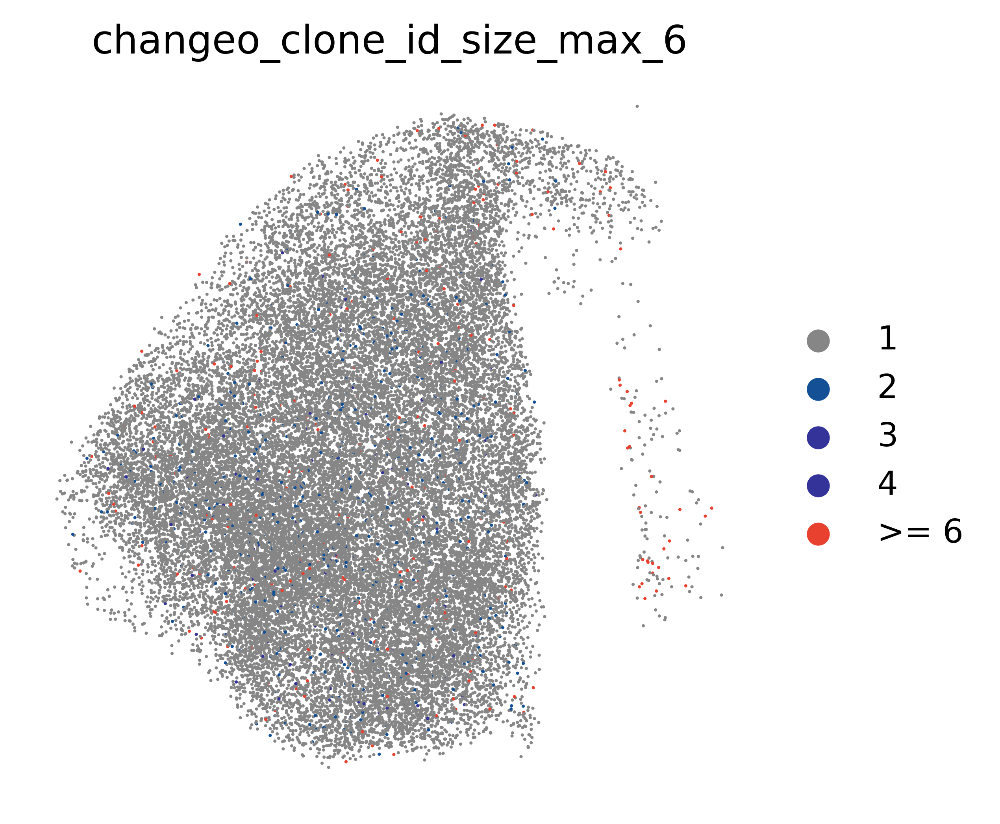

In [95]:
plt.style.use('default')
plt.rcParams['figure.figsize'] = [4, 4]
plt.rcParams['figure.dpi'] = 300
sc.pl.umap(adata, color="changeo_clone_id_size_max_6",palette={'1': '#868686', '2': '#145096', '3': '#333399', '4': '#333399', '>= 6': '#e9412f'},show=False,frameon=False)
# plt.savefig("/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Main_Figure5/Figure5C_BCR_allVDJ.pdf",bbox_inches='tight')
# plt.savefig("/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Main_Figure5/Figure5C_BCR_allVDJ_clone2024.pdf",bbox_inches='tight')

In [79]:
cols_with_IR 

,v_call_B_VDJ_main,d_call_B_VDJ_main,j_call_B_VDJ_main,v_call_B_VJ_main,j_call_B_VJ_main
Cellname,,,,,
Z48_AAACCTGAGATAGGAG-1,IGHV4-4,None,IGHJ4,IGLV1-44,IGLJ3
Z48_AAATGCCCATATACGC-1,IGHV3-33,IGHD6-13,IGHJ4,IGKV3-15,IGKJ5
Z48_AACTGGTGTCCATGAT-1,IGHV1-8,None,IGHJ3,IGLV1-44,IGLJ2
Z48_ACAGCTACACATGGGA-1,IGHV7-4-1,None,IGHJ3,IGKV3-20,IGKJ1
Z48_ACATACGCACTCTGTC-1,IGHV4-34,None,IGHJ5,IGKV1-9,IGKJ2
...,...,...,...,...,...
Z123_TTTGCGCTCTTAGAGC-1,IGHV3-20,IGHD1-7,IGHJ6,IGKV1D-39,IGKJ2
Z123_TTTGTCAAGTACACCT-1,IGHV3-33,None,IGHJ4,IGKV2D-28,IGKJ1
Z123_TTTGTCAGTTTGTTGG-1,IGHV5-10-1,None,IGHJ4,IGLV3-16,IGLJ2


In [80]:
adata_select=adata
v_call_B_VDJ_main_list = list(adata_select.obs['v_call_B_VDJ_main'].cat.categories)
d_call_B_VDJ_main_list = list(adata_select.obs['d_call_B_VDJ_main'].cat.categories)
j_call_B_VDJ_main_list = list(adata_select.obs['j_call_B_VDJ_main'].cat.categories)
v_call_B_VJ_main_list = list(adata_select.obs['v_call_B_VJ_main'].cat.categories)
j_call_B_VJ_main_list = list(adata_select.obs['j_call_B_VJ_main'].cat.categories)

TCR_list = v_call_B_VJ_main_list+j_call_B_VJ_main_list+v_call_B_VDJ_main_list +d_call_B_VDJ_main_list +j_call_B_VDJ_main_list 

In [81]:
# sc.pl.dotplot(adata2s,Bcell_type_genes,groupby=['Last_cell_type'])

In [82]:
adata.write_h5ad("./All_scanpyData/Data/Scanpy_lastCell_BCRall.h5ad")

In [83]:
vdjx.write_pkl('./All_scanpyData/Data/Scanpy_lastCell_BCRall_vdjx.pkl')

In [84]:
# adata=adata[adata.obs.Last_cell_type.str.contains("B")]
# adata=adata[~adata.obs.Last_cell_type.str.contains("PP")]

In [85]:
# adata

In [86]:
# vdjx

In [87]:
adata.obs.to_csv("./All_scanpyData/Data/BCRobs.csv")

In [88]:
pwd

'/data5/maolp/Gaofeng_All_matrix/Allcount'